In [75]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import calendar
import folium
import shapefile
import math
from os import listdir
from os.path import isfile, join
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from shapely.geometry.polygon import Polygon
from descartes import PolygonPatch
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pandas import tseries

base_dir = 'Dati/dataset'

to_mese = {'1': 'Jan', '2': 'Feb', '3': 'Mar', '4': 'Apr', '5': 'May',
            '6': 'Jun', '7': 'Jul', '8': 'Aug', '9': 'Sep', '10': 'Oct', '11': 'Nov', '12': 'Dec'}


In [11]:
Files = [
'MarcheQuakeArea_20150416_20150427_24.csv',
'MarcheQuakeArea_20150516_20150527_24.csv',
'MarcheQuakeArea_20150916_20150927_24.csv',
'MarcheQuakeArea_20160416_20160427_24.csv',
'MarcheQuakeArea_20160516_20160527_24.csv',
'MarcheQuakeArea_20160816_20160901_24.csv', # mese del terremoto
'MarcheQuakeArea_20160916_20160927_24.csv',
'MarcheQuakeArea_20161016_20161027_24.csv',
'MarcheQuakeArea_20170416_20170427_24.csv',
'MarcheQuakeArea_20170516_20170527_24.csv',
'MarcheQuakeArea_20170916_20170927_24.csv',
'MarcheQuakeArea_20171016_20171027_24.csv',
'MarcheQuakeArea_20180401_20180413_24.csv'
]
def leggi_file (comune, File):
    data = pd.read_csv(f'{base_dir}/{File}')
    data.rtime = pd.to_datetime(data.time, format = '%Y%m%d_%H%M')
    data['hour'] = data.rtime.dt.hour
    mese = f'{data.time[0][4:6]}-{data.time[0][:4]}'
    data = data.loc[(data.hour > 23) | (data.hour < 7)]
    data = data.drop('hour', axis = 'columns')
    data = data.loc[data.assoc_comuni == comune]
    if 'rtime' in data.columns:
        data = data.drop( 'rtime', axis = 'columns')
    data = data.drop(['time', 'assoc_comuni'], axis = 'columns').groupby(['base2mid', 'RER_32']).aggregate('val').mean().reset_index()
    data = data.rename(columns = {'val': mese})
    return data

In [12]:
comune = 'Macerata'
data =  leggi_file(comune, Files[0])
for i in range(1,len(Files)):
    data = data.merge(leggi_file(comune, Files[i]))

<ipython-input-11-48a7bd99a814>:18: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  data.rtime = pd.to_datetime(data.time, format = '%Y%m%d_%H%M')
<ipython-input-11-48a7bd99a814>:18: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  data.rtime = pd.to_datetime(data.time, format = '%Y%m%d_%H%M')
<ipython-input-11-48a7bd99a814>:18: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  data.rtime = pd.to_datetime(data.time, format = '%Y%m%d_%H%M')


In [ ]:
sezione = '879 1'
def plot(sezione, data):
    grafico = data.loc[data.base2mid == sezione]
    grafico = grafico.melt( id_vars = ['base2mid', 'RER_32'], value_vars = grafico.columns[2:])
    plt.plot(data.columns[2:], grafico.value)
    plt.scatter(data.columns[2:], grafico.value)
    plt.grid()
    plt.xticks(rotation=90, c = 'green')
    plt.yticks(c = 'green')
    hq = 'zona terremotata' if data.iloc[ 0,1] == 1 else 'zona non terremotata'
    plt.title(f'{sezione}, sezione di {comune}, {hq}', c = 'green')
plot(sezione,data)

In [ ]:
perc = data.copy()
for i in range(3, data.columns.size):
    perc.iloc[:,i]= (perc.iloc[:, i] - perc.iloc[:,2])/perc.iloc[:,i] *100
perc.iloc[:,2] = 0
plot(sezione, perc)

In [ ]:
sez = gpd.read_file('Istat/Com01012016_WGS84.shp')
sez = sez[['COMUNE', 'geometry', 'PRO_COM']]
sez.head()

In [ ]:
for i in range (0,len(Files)):
    cartella_destinazione = 'Dati/Fatti da Niki/'
    data = pd.read_csv(f'{base_dir}/{Files[i]}')
    data['rtime'] = pd.to_datetime(data.time, format = '%Y%m%d_%H%M')
    data['hour'] = data.rtime.dt.hour
    mese = f'{data.time[0][4:6]}-{data.time[0][:4]}'
    data = data.loc[(data.hour > 23) | (data.hour < 7)]
    data = data.drop('hour', axis = 'columns')
    data = data.groupby(['time', 'assoc_comuni']).aggregate('val').sum().reset_index()
    data['day'] = data.rtime.dt.date
    data = data.groupby(['assoc_comuni','day']).aggregate('val').mean().reset_index()
    data= data.rename(columns = {'assoc_comuni' : 'comune', 'day' : 'data', 'val' : 'n_abitanti'})
    mese = f'{Files[i].split("_")[1][4:6]}-{Files[i].split("_")[1][:4]}'
    data.to_csv(f'{cartella_destinazione}Marche({mese}).csv', index = False)
    print(f'{mese} -> fatto!')

In [37]:
FileN = [
'Marche(04-2015).csv',
'Marche(04-2016).csv',
'Marche(04-2017).csv',
'Marche(04-2018).csv',
'Marche(05-2015).csv',
'Marche(05-2016).csv',
'Marche(05-2017).csv',
'Marche(08-2016).csv',
'Marche(09-2015).csv',
'Marche(09-2016).csv',
'Marche(09-2017).csv',
'Marche(10-2016).csv',
'Marche(10-2017).csv']

percNiki = 'Dati/Fatti da Niki'
base = pd.read_csv(f'{percNiki}/{FileN[0]}')
for i in range(1, len(FileN)):
    base = base.append(pd.read_csv(f'{percNiki}/{FileN[i]}'))
base = base.rename(columns = {'n_abitanti' : 'val'})


In [36]:
data = base.copy()
comune = 'Ancona'
data = data.loc[data.comune == comune]
data = data.loc[~(data.val == 0)]
data['mese'] = data.data.apply(lambda y: y[:-3])
data = data.groupby('mese').aggregate('val').mean().reset_index()


def plot(data):
    plt.plot(data['mese'], data['val'])
    plt.scatter(data['mese'], data['val'])
    plt.xticks(rotation=90)
    plt.grid()
    hq_time = datetime.strptime('20160824_0336','%Y%m%d_%H%M')
plot(data)

AttributeError: 'DataFrame' object has no attribute 'comune'

In [84]:
comu = base.comune.unique()

utile = base.loc[base.comune == comu[0]]
utile = utile.loc[~(utile.val == 0)]
utile['mese'] = utile.data.apply(lambda y: y[:-3])
utile = utile.groupby('mese').aggregate('val').mean().reset_index()
utile = utile.transpose()
for i in range(1, len(utile.columns)):
    utile.iloc[1, i] = (utile.iloc[1,i] - utile.iloc[1,0])/utile.iloc[1,0] *100
utile.iloc[1,0] = 0


for i in comu[1:]:
    db = base.loc[base.comune == i]
    db = db.loc[~(db.val == 0)]
    db['mese'] = db.data.apply(lambda y: y[:-3])
    db = db.groupby('mese').aggregate('val').mean().reset_index()
    db = db.transpose()
    for i in range(1, len(db.columns)):
        db.iloc[1, i] = (db.iloc[1,i] - db.iloc[1,0])/db.iloc[1,0] *100
    db.iloc[1,0] = 0
    utile = utile.append(db.iloc[1,:])
utile = utile.rename(columns = {0 : utile.iloc[0,0], 1: utile.iloc[0,1], 2: utile.iloc[0,2], 3: utile.iloc[0,3], 4: utile.iloc[0,4], 5: utile.iloc[0,5], 6: utile.iloc[0,6], 7: utile.iloc[0,7], 8: utile.iloc[0,8], 9: utile.iloc[0,9], 10: utile.iloc[0,10], 11: utile.iloc[0,11], 12: utile.iloc[0,12]})
utile = utile.drop(index = 'mese')

utile = utile.set_index(comu)

#utile.to_csv('Dati/Fatti da Niki/Marche_perc_TOT.csv')

Usiamo il file Marche_perc_TOT

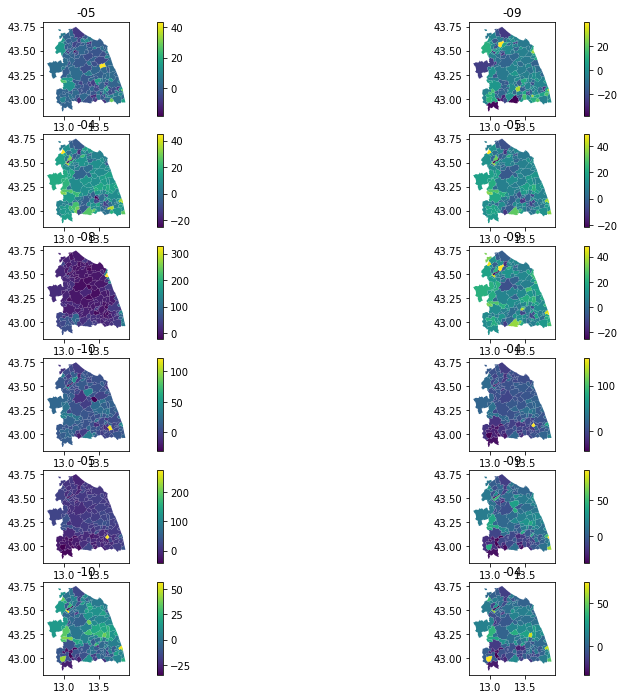

In [141]:
data = pd.read_csv('Dati/Fatti da Niki/Marche_perc_TOT.csv')
map = gpd.read_file('Dati/shp/Comuni2016/marche.shp')
map = map.loc[:,['COMUNE','geometry']]
data = map.merge(data, how = 'left')
data.dropna(axis = 'rows', how = 'any', inplace = True)

series = list(data.columns[3:])
nrows = math.ceil(len(series)/2)

plt.rcParams['figure.figsize'] = [14, 12]
fig, axes = plt.subplots(nrows=nrows, ncols=2)

k = 0
for i in range(nrows):
    for j in range(2):
        divider = make_axes_locatable(axes[i,j])
        cax = divider.append_axes("right", size="5%", pad='10%')
        axes[i,j].set_title(series[k][4:])
        data.plot(column=series[k], ax=axes[i,j], cax=cax, legend=True)
        k+=1
        if k == len(series):
            break

In [157]:


def style_function(x):
    color = '#ff0000' if x['properties']['RER_32'] == 1 else '#000000'
    fill = '#ff7777' if x['properties']['RER_32'] == 1 else '#ffffff'
    #print(x['properties']['RER_32'])
    return {'fillColor': fill,
            'color':color,
            'fillOpacity': 0.1,
            'weight': 0.5}

def highlight_function(x):
    color = '#ff0000' if x['properties']['RER_32'] == 1 else '#000000'
    fill = '#990000' if x['properties']['RER_32'] == 1 else '#000000'
    return {'fillColor': fill,
            'color':color,
            'fillOpacity': 0.50,
            'weight': 0.1}


simple_map = data.copy()
simple_map = simple_map.to_crs(epsg=4326)
simple_map['geometry'] = simple_map['geometry'].simplify(0.001, preserve_topology=False)
#myscale = (simple_map['YOY'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
myscale = [-40,-30,-20,-10,0,10,20,30,40]

val = '2015-09'




m = folium.Map(location=[simple_map.centroid.y.mean(), simple_map.centroid.x.mean()], tiles="cartodbpositron", zoom_start=8)
folium.Choropleth(
 geo_data=map,
 name='Choropleth',
 data=simple_map,
 columns=['COMUNE',val],
 key_on="feature.properties.COMUNE",
 fill_color='Greens',
threshold_scale= myscale,
 fill_opacity=1,
 line_opacity=0.2,
 legend_name='YOY %',
 smooth_factor=0
).add_to(m)





for index,row in simple_map.iterrows():
    index, row

m

<ipython-input-157-15c65934bff2>:30: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[simple_map.centroid.y.mean(), simple_map.centroid.x.mean()], tiles="cartodbpositron", zoom_start=8)


In [ ]:
other = folium.features.GeoJson(
    simple_map,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['COMUNE','RER_32',val],
        aliases=['Comune: ','HQ_AREA','Change %: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
)

m.add_child(other)
m.keep_in_front(other)
folium.LayerControl().add_to(m)